### Join

Often data is spread across two tables. Joining provides us with a way to combine related tables. We will match rows based on the entries in their columns.

In [81]:
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
%matplotlib inline
import os
import folium
import folium.plugins
from IPython.display import HTML, display

#### Zip Files

We generate zip files to reduce the size of a collection of files. How can we reduce the size of a file? 

When we have an ordered collection of data like a list, we can record the differences between entries. Sometimes the differences are much smaller.

**Exercise**

In [25]:
def original_to_differences(old_list):
    new_list = len(old_list) * [0]
    
    for index, entry in enumerate(old_list):
        if index == 0:
            new_list[index] = entry
        else:
            new_list[index] = old_list[index] - old_list[index - 1]

    return new_list
        
def differences_to_original(old_list):
    new_list = len(old_list) * [0]
    
    for index, entry in enumerate(old_list):
        if index == 0:
            new_list[index] = entry
        else:
            new_list[index] = old_list[index] + new_list[index - 1]

    return new_list

1. Compute `original_to_differences([1001,1004,1009,1015,1021])`
1. Compute `differences_to_original(original_to_differences([1001,1004,1009,1015,1021]))`

**Dataset**

Let's start by reading data from the given zip file. To showcase how to do read data that is inside zip files, we're going to use the `zipfile` module. Doing so will allow us to avoid needing to unzip the data. Running the cell below, we see that the zip file contains `elections.csv` and `presidents.csv`.

In [73]:
join_demo_filename = os.environ["HOME"] + "/shared/week5-lec1-demo-data.zip"

my_zip = zipfile.ZipFile(join_demo_filename, 'r')

In [50]:
list_names = [f.filename for f in my_zip.filelist]
list_names

['elections.csv', 'presidents.csv']

We could call `my_zip.extractall()` to unzip the files, but we won't. Instead, we'll read directly from the zip file itself.

In [51]:
file_handle = my_zip.open("elections.csv")

elections = pd.read_csv(file_handle)

file_handle.close()

In [52]:
elections.head(5)

,Year,Candidate,Party,Popular vote,Result,%
0,1824,Andrew Jackson,Democratic-Republican,151271,loss,57.210122
1,1824,John Quincy Adams,Democratic-Republican,113142,win,42.789878
2,1828,Andrew Jackson,Democratic,642806,win,56.203927
3,1828,John Quincy Adams,National Republican,500897,loss,43.796073
4,1832,Andrew Jackson,Democratic,702735,win,54.574789


In [53]:
file_handle = my_zip.open("presidents.csv")

presidents = pd.read_csv(file_handle)

file_handle.close()

In [54]:
presidents.head(5)

,Date of birth,President,Birthplace,State of birth,In office
0,"February 22, 1732",George Washington,Westmoreland County,Virginia,"(1st) April 30, 1789 – March 4, 1797"
1,"October 30, 1735",John Adams,Braintree,Massachusetts,"(2nd) March 4, 1797 – March 4, 1801"
2,"April 13, 1743",Thomas Jefferson,Shadwell,Virginia,"(3rd) March 4, 1801 – March 4, 1809"
3,"March 16, 1751",James Madison,Port Conway,Virginia,"(4th) March 4, 1809 – March 4, 1817"
4,"April 28, 1758",James Monroe,Monroe Hall,Virginia,"(5th) March 4, 1817 – March 4, 1825"


#### Merge

To join tables `df` and `df2`, we call the function `df.merge(df2)`. Merge is just the word that the authors of pandas picked for joining tables. I don't know why.

Note that pandas also has a function called `df.join`. This is a limited version of `merge` that uses the index. For ths sake of generality, we will only use `merge` in this class.

In [55]:
inner = elections.merge(presidents, 
            how = "inner",
            left_on = "Candidate", right_on = "President")

In [56]:
inner.sample(10)

,Year,Candidate,Party,Popular vote,Result,%,Date of birth,President,Birthplace,State of birth,In office
14,1860,Abraham Lincoln,Republican,1855993,win,39.699408,"February 12, 1809",Abraham Lincoln,Sinking Spring,Kentucky,"(16th) March 4, 1861 – April 15, 1865"
12,1856,James Buchanan,Democratic,1835140,win,45.306080,"April 23, 1791",James Buchanan,Cove Gap,Pennsylvania,"(15th) March 4, 1857 – March 4, 1861"
13,1856,Millard Fillmore,American,873053,loss,21.554001,"January 7, 1800",Millard Fillmore,Summerhill,New York,"(13th) July 9, 1850 – March 4, 1853"
35,1972,Richard Nixon,Republican,47168710,win,60.907806,"January 9, 1913",Richard Nixon,Yorba Linda,California,"(37th) January 20, 1969 – August 9, 1974"
32,1932,Herbert Hoover,Republican,15761254,loss,39.830594,"August 10, 1874",Herbert Hoover,West Branch,Iowa,"(31st) March 4, 1929 – March 4, 1933"
40,1984,Ronald Reagan,Republican,54455472,win,59.023326,"February 6, 1911",Ronald Reagan,Tampico,Illinois,"(40th) January 20, 1981 – January 20, 1989"
46,2004,George W. Bush,Republican,62040610,win,50.771824,"July 6, 1946",George W. Bush,New Haven,Connecticut,"(43rd) January 20, 2001 – January 20, 2009"
45,2000,George W. Bush,Republican,50456002,win,47.974666,"July 6, 1946",George W. Bush,New Haven,Connecticut,"(43rd) January 20, 2001 – January 20, 2009"
6,1840,Martin Van Buren,Democratic,1128854,loss,46.948787,"December 5, 1782",Martin Van Buren,Kinderhook,New York,"(8th) March 4, 1837 – March 4, 1841"
9,1840,William Henry Harrison,Whig,1275583,win,53.051213,"February 9, 1773",William Henry Harrison,Charles City County,Virginia,"(9th) March 4, 1841 – April 4, 1841"


Notice that:
1. The output dataframe only contains rows that have names in both tables.  For example, presidents before 1824 do not appear in the joined table because there was no popular vote before 1824.
1. The name `Andrew Jackson` occurred three times in the election table and shows up three times in the output. 
1. `Grover Cleveland` occurs six times! Twice for every election he was in. This is because he appears three times in the `elections` table and twice in the `presidents` table. This results in 3 x 2 = 6 combinations.
1. Several presidents are missing because their names are not an exact match. For example, John F. Kennedy is "John Kennedy" in the elections table and "John F. Kennedy" in the presidents table.

### Plot

With the caveats above in mind, let us make a chart to summarize the data. We will focus on the age of each president when they were elected. We use a scatter-plot meaning a line-chart without the lines connecting the data.

In [57]:
def get_year(some_string):
    after_comma = some_string.split(",")[1]
    return int(after_comma)

get_year("October 1, 1924")

1924

Note that we just want to plot teh age of the winners at the time of election.

In [58]:
# filter

winners = inner.loc[inner["Result"] == "win",["Year","Date of birth"]]

In [59]:
# apply 

winners["Birthyear"] = winners["Date of birth"].apply(get_year)

In [67]:
# compute age

winners["Age"] = winners["Year"] - winners["Birthyear"]

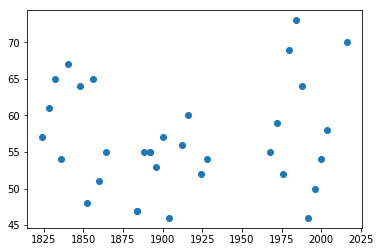

In [66]:
# genearte plot -- we will discuss plotting next lecture

plt.scatter(winners["Year"], winners["Age"]);

#### Duplicate Rows

How could we fix the duplicate Grover Cleveland?

We could group by name/candidate and take only the first:

In [ ]:
def select_first(some_series):
    return some_series.values[0]

inner = elections.merge(presidents, 
    how = "inner",
    left_on = "Candidate", right_on = "President")
inner = inner.sort_values("Year", ascending = True) 
inner.groupby(['Candidate',"Year"]).agg(select_first)

### Right Join

The above join was an inner join.  What if we wanted to keep all of the presidents and leave missing data for years when there was no popular vote? In this case we'd do a "right" join, where we make sure to include EVERY row from our right dataframe, in this case `presidents`.

In [ ]:
elections.merge(presidents, 
            how = "right",
            left_on = "Candidate", right_on = "President")

Similarly, if we also want to include candidates not in the presidents table (e.g. because they had never won), we can use a "left" join.

In [ ]:
elections.merge(presidents, 
            how = "left",
            left_on = "Candidate", right_on = "President")

If we wanted to keep both, we can instead do an "outer join".

In [ ]:
elections.merge(presidents, 
            how = "outer",
            left_on = "Candidate", right_on = "President")

**Exercise** What about a cross join?

While pandas has many components, it lacks cross join. However, we can use a trick. We add an extra column to both of the tables with the same entry.

Let us add a column to `elections` where the value is always 0.

In [69]:
elections["extra_column_elections"] = 0

Let us add a column to `presidents` where the value is always 0.

In [70]:
presidents["extra_column_presidents"] = 0

Now we can take an inner join on the columns

In [ ]:
elections.merge(presidents, 
            how = "right",
            left_on = "extra_column_elections", right_on = "extra_column_presidents")

#### Data Types

This week you will be looking at criminal records from the New York City police department in lab. You will be processing the data to make visualizations. Here we want to understand the properties of the dataset

- scope
- granularity 
- temporality 
- faithfulness

Along the way, we will generate a [Heat Map](https://en.wikipedia.org/wiki/Heat_map) to show the distribution of crime across the five boroughs. A heat map is a graphical representation of a table where numbers are translated into colors.

In [17]:
crime = pd.read_csv(os.environ["HOME"] + "/shared/NYC_Complaint_Data_partial.csv")
crime_desriptions = pd.read_csv(os.environ["HOME"] + "/shared/Crime_Column_Description.csv")

In [18]:
NY_COORDINATES = (40.7, -74.0)
ny_map = folium.Map(location=NY_COORDINATES, zoom_start=18)

locs = crime[['Latitude', 'Longitude']].astype('float').dropna().values

heatmap = folium.plugins.HeatMap(locs.tolist(), radius = 10)
ny_map.add_child(heatmap);

display(ny_map)